In [2]:

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import os, random
from s2cloudless import S2PixelCloudDetector
import random
import rasterio

# Function Definitions 

In [67]:
def load_and_prepare_vis(path):
    """Load a PNG/JPG, drop alpha if present, normalize to [0,1]."""
    arr = np.array(Image.open(path))
    if arr.ndim == 3 and arr.shape[2] == 4:
        arr = arr[..., :3]
    return arr.astype(np.float32) / 255.0  # shape (H,W,3)

def load_and_prepare_nir(path):
    """
    Load a .npy IR stack with ≥3 channels,
    collapse to one band via mean, normalize to [0,1].
    """
    raw = np.load(path).astype(np.float32)   # e.g. shape (H,W,3)
    # collapse channels:
    nir = np.mean(raw[..., :3], axis=-1)     # shape (H,W)
    # min–max normalize:
    mn, mx = nir.min(), nir.max()
    if mx > mn:
        nir = (nir - mn) / (mx - mn)
    else:
        nir = np.zeros_like(nir)
    return nir

def load_and_prepare_ir(path):
    """
    Loads an .npy file, extracts the first 3 channels,
    converts to float32, and min–max normalizes to [0,1].
    """
    data = np.load(path)
    
    # Ensure at least 3 channels
    if data.ndim == 3 and data.shape[2] >= 3:
        rgb = data[..., :3]
    else:
        raise ValueError(f"Expected at least 3 channels, got shape {data.shape}")
    
    # Convert to float32
    rgb = rgb.astype(np.float32)
    
    # Min–max normalize
    min_val = rgb.min()
    max_val = rgb.max()
    if max_val > min_val:
        rgb_norm = (rgb - min_val) / (max_val - min_val)
    else:
        # All pixels identical: return zeros
        rgb_norm = np.zeros_like(rgb)
    
    return rgb_norm

def compute_cloud_mask(vis, nir, blue_thresh=0.6, nir_thresh=0.3):
    """
    Simple rule: cloud if blue is high AND NIR is low.
     - vis[...,2] is blue band
     - nir is normalized [0,1] float
    """
    blue = vis[..., 2]
    return (blue > blue_thresh) & (nir < nir_thresh)
    


def plot_rgb_image(img, title='Image', figsize=(8, 8)):
    """
    Displays a normalized RGB image (values in [0,1]).
    """
    plt.figure(figsize=figsize)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()



def load_and_prep_visual_image(path):
    """
    Load a visible-light PNG, drop alpha if present,
    and normalize pixel values to [0,1].
    
    Parameters:
    - path (str): Path to the image file.
    
    Returns:
    - arr_norm (np.ndarray): Normalized H×W×3 array.
    """
    img = Image.open(path)
    arr = np.array(img)
    
    # Drop alpha channel if there is one
    if arr.ndim == 3 and arr.shape[2] == 4:
        arr = arr[..., :3]
    
    # Normalize to [0,1]
    arr_norm = arr.astype(np.float32) / 255.0
    return arr_norm

def plot_visual_image(img, title='Visible Image', figsize=(8, 8)):
    """
    Display a normalized RGB image array.
    
    Parameters:
    - img (np.ndarray): Image array in [0,1].
    - title (str): Plot title.
    - figsize (tuple): Figure size.
    """
    plt.figure(figsize=figsize)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()







# EDA

#### Vis/ IR comparison

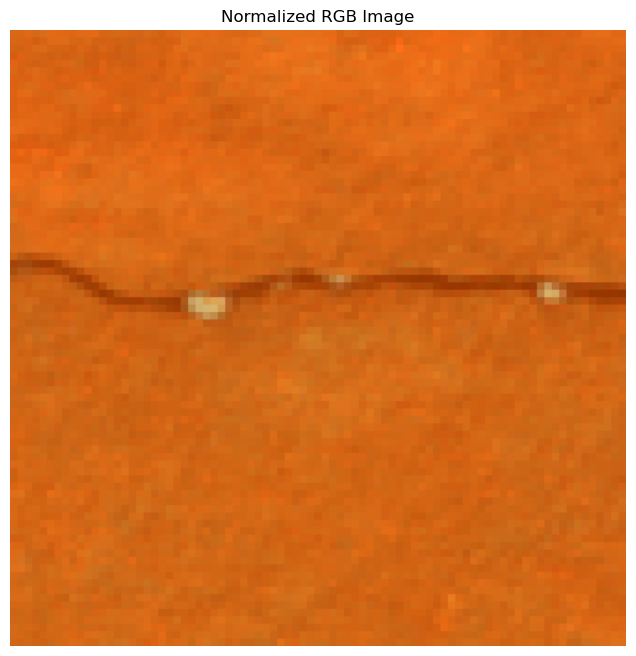

In [14]:
dataimg = load_and_normalize_image('example_ir.npy')
plot_rgb_image(dataimg, title='Normalized RGB Image')

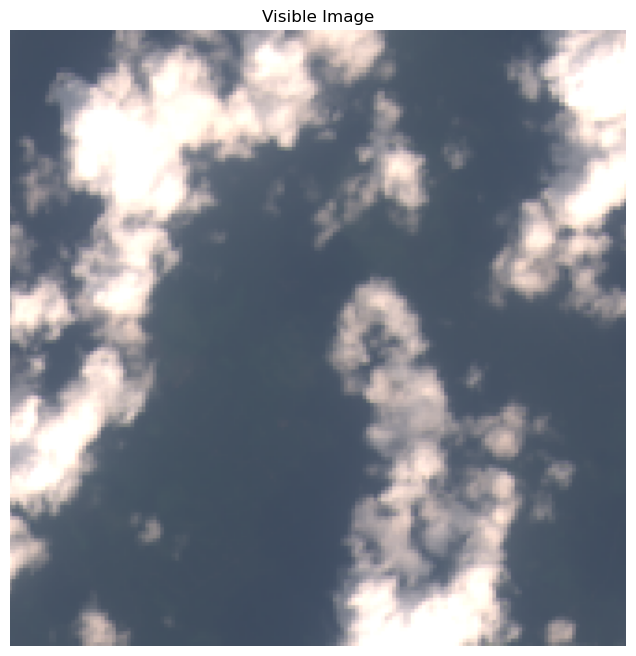

In [17]:

# Example usage:
vis = load_and_prep_visual_image('example_visible.png')
plot_visual_image(vis, title='Visible Image')

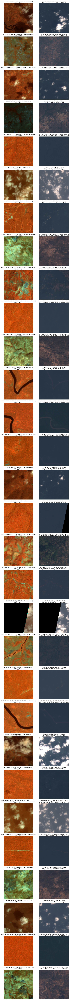

In [73]:
# 1. point this at the folder containing all your location subfolders
base_dir = 'my_examples_landsat_final_detailed'

# 1. gather your location folders
locs = [d for d in os.listdir(base_dir)
        if os.path.isdir(os.path.join(base_dir, d))]

# 2. pick 3 random (or fewer if you don't have 3)
sample_locs = random.sample(locs, min(30, len(locs)))

# 3. set up a 3×2 grid
fig, axes = plt.subplots(len(sample_locs), 2, figsize=(12, 5 * len(sample_locs)))

for row, sel in enumerate(sample_locs):
    ir_dir  = os.path.join(base_dir, sel, 'images', 'infrared')
    vis_dir = os.path.join(base_dir, sel, 'images', 'visible')

    ir_file  = random.choice([f for f in os.listdir(ir_dir) 
                              if f.endswith('.npy')])
    vis_file = random.choice([f for f in os.listdir(vis_dir) 
                              if f.lower().endswith(('.png','jpg','jpeg'))])

    ir_path  = os.path.join(ir_dir,  ir_file)
    vis_path = os.path.join(vis_dir, vis_file)

    ir_img  = load_and_prepare_ir(ir_path)
    vis_img = load_and_prepare_vis(vis_path)
    

    # transpose spatial axes of IR to align with visible
    # new shape: (W, H, 3)
    ir_img_t = np.transpose(ir_img, (1, 0, 2))

    # plot IR
    ax = axes[row, 0]
    ax.imshow(ir_img_t)
    ax.set_title(f'{sel} — IR (transposed)\n{ir_file}')
    ax.axis('off')

    # plot visible
    ax = axes[row, 1] 
    ax.imshow(vis_img)
    ax.set_title(f'{sel} — Visible\n{vis_file}')
    ax.axis('off')
plt.tight_layout()
plt.show()

#### Cloud Masking Investigation

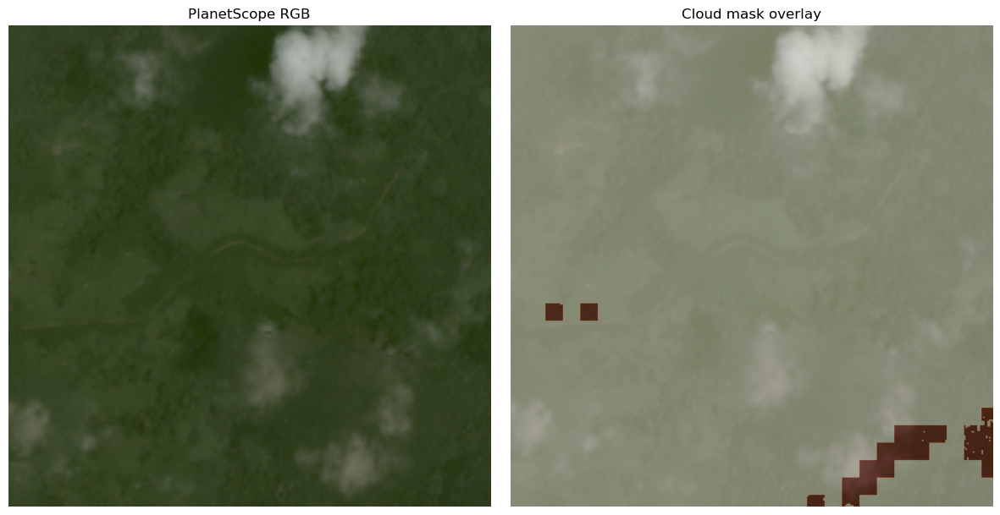

In [46]:



# ─── Example usage ─────────────────────────────────────────────────────────

vis_path = 'example_vis.png'
nir_path = 'example_ir.npy'

# 1) load
vis = load_and_prepare_vis(vis_path)
nir = load_and_prepare_nir(nir_path)

# 2) compute mask
cloud_mask = compute_cloud_mask(vis, nir,
                                blue_thresh=0.1,   # tune me!
                                nir_thresh=0.1)    # tune me!

# 3) visualize
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(vis)
plt.title('PlanetScope RGB')
plt.axis('off')

plt.subplot(1,2,2)
# overlay mask in red
plt.imshow(vis)
plt.imshow(cloud_mask, cmap='Reds', alpha=0.4)
plt.title('Cloud mask overlay')
plt.axis('off')

plt.tight_layout()
plt.show()


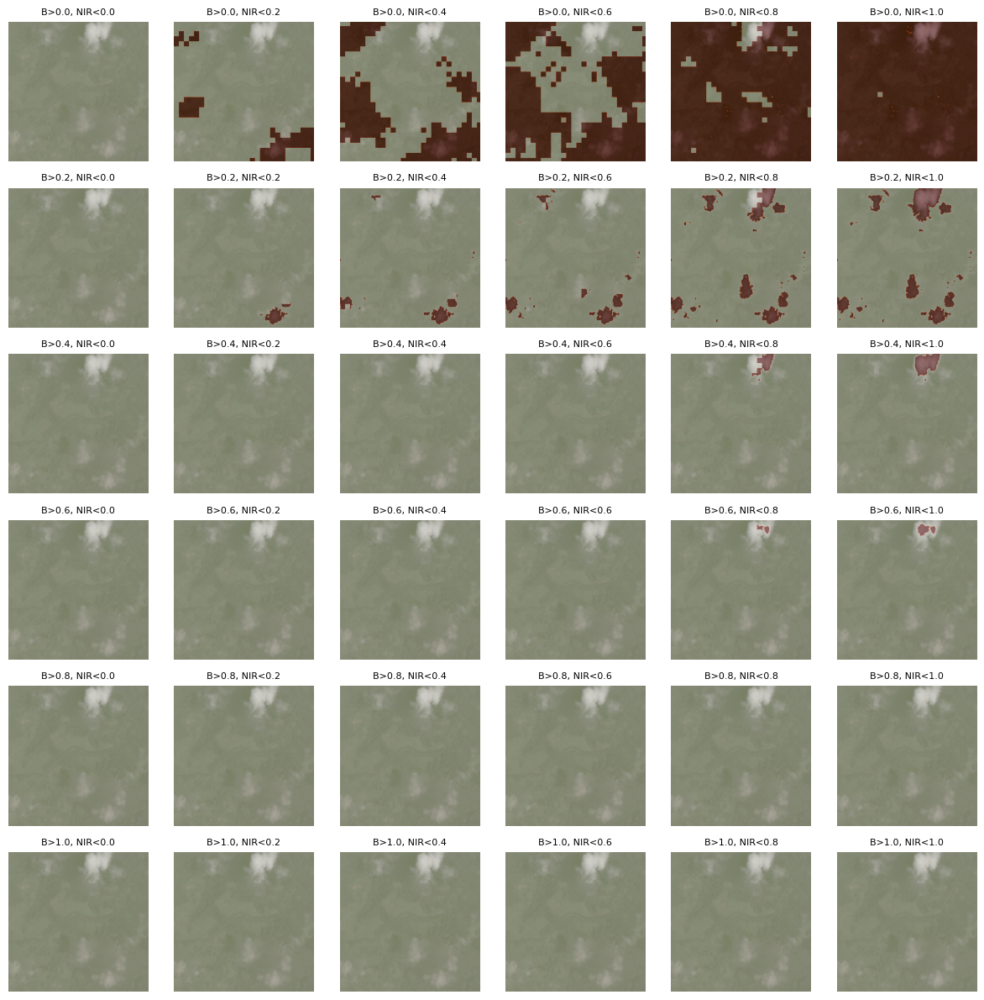

In [47]:


# define your threshold ranges
blue_vals = np.arange(0.0, 1.01, 0.2)
nir_vals  = np.arange(0.0, 1.01, 0.2)

n_b = len(blue_vals)
n_n = len(nir_vals)

# set up the grid
fig, axes = plt.subplots(n_b, n_n, figsize=(n_n*2, n_b*2))

for i, b in enumerate(blue_vals):
    for j, n_t in enumerate(nir_vals):
        # compute mask
        mask = compute_cloud_mask(vis, nir, blue_thresh=b, nir_thresh=n_t)
        
        ax = axes[i, j]
        ax.imshow(vis)
        ax.imshow(mask, cmap='Reds', alpha=0.4)
        ax.set_title(f'B>{b:.1f}, NIR<{n_t:.1f}', fontsize=8)
        ax.axis('off')

plt.tight_layout()
plt.show()


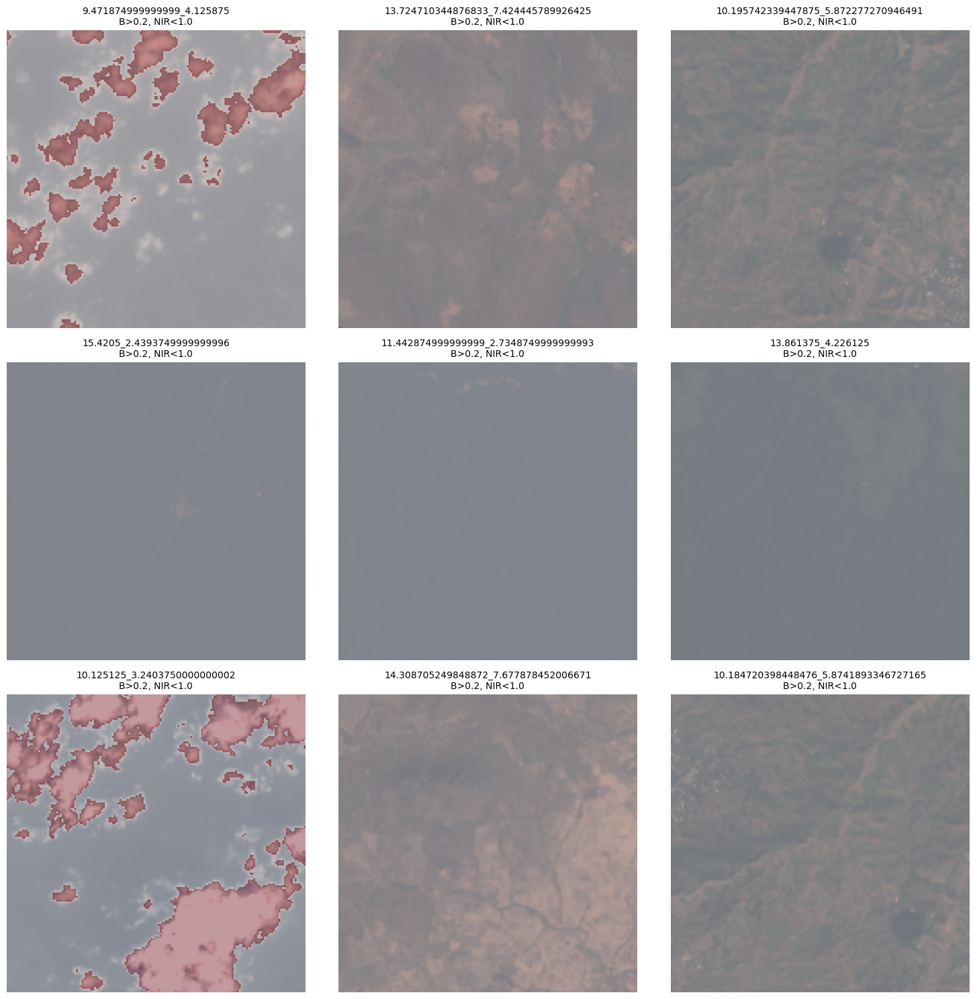

In [61]:

base_dir = 'my_examples_landsat_final_detailed'

# 1) gather all location subfolders
locs = [d for d in os.listdir(base_dir)
        if os.path.isdir(os.path.join(base_dir, d))]

# 2) pick up to 9 random locations
sample_locs = random.sample(locs, min(9, len(locs)))

# 3) prepare 3×3 grid
n = len(sample_locs)
cols = 3
rows = int(np.ceil(n / cols))
fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
axes = axes.flatten()

for ax, sel in zip(axes, sample_locs):
    # pick a random IR and visible file
    ir_dir  = os.path.join(base_dir, sel, 'images', 'infrared')
    vis_dir = os.path.join(base_dir, sel, 'images', 'visible')

    ir_file  = random.choice([f for f in os.listdir(ir_dir) 
                              if f.lower().endswith('.npy')])
    vis_file = random.choice([f for f in os.listdir(vis_dir) 
                              if f.lower().endswith(('.png','jpg','jpeg'))])

    ir_path  = os.path.join(ir_dir,  ir_file)
    vis_path = os.path.join(vis_dir, vis_file)

    # load & normalize
    ir_stack = load_and_prepare_ir(ir_path)      # (H,W,3)
    nir      = np.mean(ir_stack[..., :3], axis=-1)  # collapse to (H,W)
    vis      = load_and_prepare_vis(vis_path)    # (H,W,3)

    # compute mask with B>0.2, NIR<1.0
    mask = compute_cloud_mask(vis, nir,
                              blue_thresh=0.6,
                              nir_thresh=1.0)

    # overlay mask on visible
    ax.imshow(vis)
    ax.imshow(mask, cmap='Reds', alpha=0.4)
    ax.set_title(f'{sel}\nB>0.2, NIR<1.0', fontsize=10)
    ax.axis('off')

# turn off any unused subplots
for ax in axes[n:]:
    ax.axis('off')

plt.tight_layout()
plt.show()


In [65]:



base_dir = 'my_examples_planet_final_detailed'

# gather all location folders
locs = [d for d in os.listdir(base_dir)
        if os.path.isdir(os.path.join(base_dir, d))]

count = 0
total = 0

for sel in locs:
    ir_dir  = os.path.join(base_dir, sel, 'images', 'infrared')
    vis_dir = os.path.join(base_dir, sel, 'images', 'visible')

    # pick the first IR and visible file in each folder
    try:
        ir_file  = next(f for f in os.listdir(ir_dir)
                        if f.lower().endswith('.npy'))
        vis_file = next(f for f in os.listdir(vis_dir)
                        if f.lower().endswith(('.png','jpg','jpeg')))
    except StopIteration:
        # skip if either is missing
        continue

    ir_path  = os.path.join(ir_dir,  ir_file)
    vis_path = os.path.join(vis_dir, vis_file)

    # load & normalize
    nir_stack = load_and_prepare_ir(ir_path)         # shape (H,W,3)
    nir       = np.mean(nir_stack[..., :3], axis=-1) # collapse to (H,W)
    vis       = load_and_prepare_vis(vis_path)       # shape (H,W,3)

    # compute mask with B>0.2, NIR<1.0
    mask = compute_cloud_mask(vis, nir,
                              blue_thresh=0.6,
                              nir_thresh=1.0)

    total += 1
    if mask.sum() > 225:
        count += 1

# calculate percentage
if total > 0:
    percent = count / total * 100
    print(f"{percent:.1f}% of images ({count}/{total}) have >225 cloud pixels")
else:
    print("No valid images found.")


30.7% of images (1045/3402) have >225 cloud pixels


#### Class Investigation

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\oliwa\\Documents\\capstone\\my_examples_planet_final_detailed\\10.344999999999997_4.772125\\images\\visible\\2015_10.344999999999997_4.772125.png'

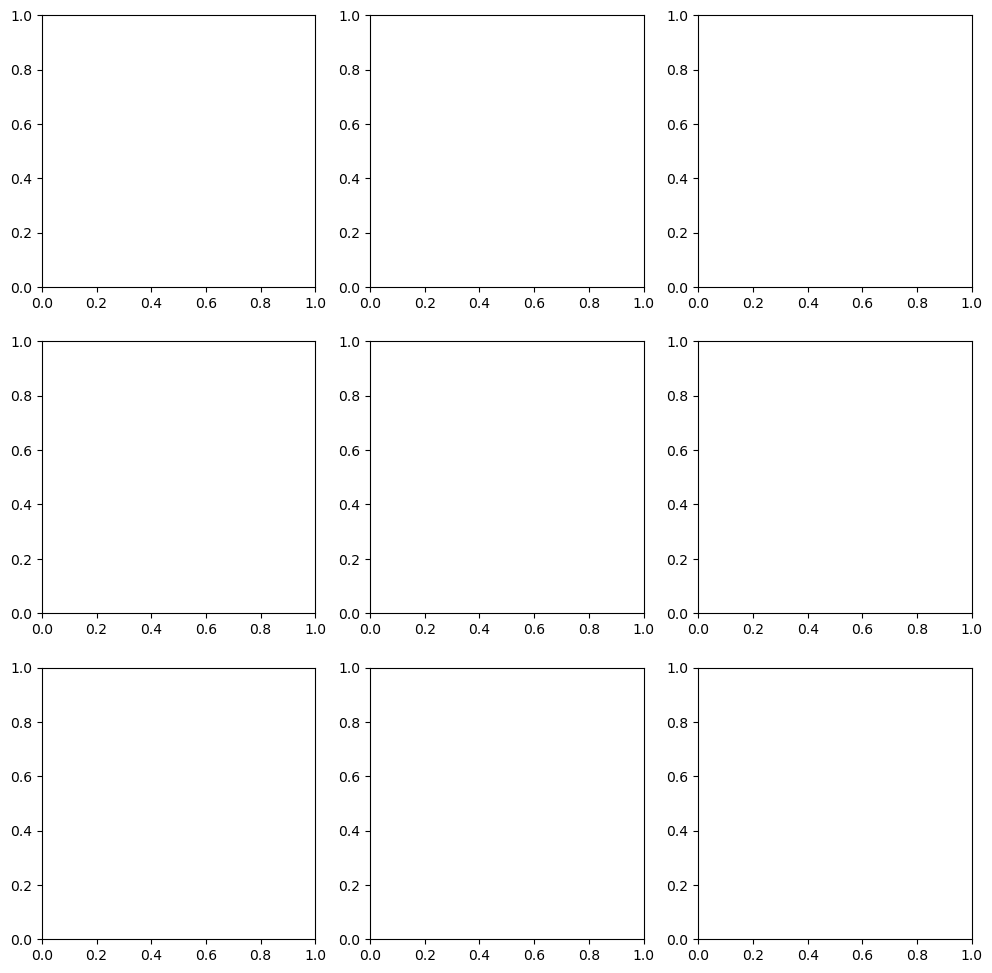

In [69]:


# — adjust this if your CSV lives somewhere else —
csv_path = r'labels/labels/Planet final versions/detailed/all.csv'

# 1) load the labels table
labels_df = pd.read_csv(csv_path)

# 2) grab 9 random samples
sample_df = labels_df.sample(n=9, random_state=42).reset_index(drop=True)

# 3) set up the plot
fig, axes = plt.subplots(3, 3, figsize=(12, 12))

for ax, (_, row) in zip(axes.flat, sample_df.iterrows()):
    # the folder for this sample
    ex_path = row['example_path']  
    # ex_path looks like 'my_examples_planet_final_detailed/9.896374999999999_3.9187499999999997'
    folder_name = os.path.basename(ex_path)
    # build the filename: e.g. '2015_9.896374999999999_3.9187499999999997.png'
    fname = f"{row['year']}_{folder_name}.png"
    img_path = os.path.join(ex_path, 'images', 'visible', fname)

    # load & plot
    img = load_and_prepare_vis(img_path)
    ax.imshow(img)
    ax.set_title(row['label'])
    ax.axis('off')

plt.tight_layout()
plt.show()


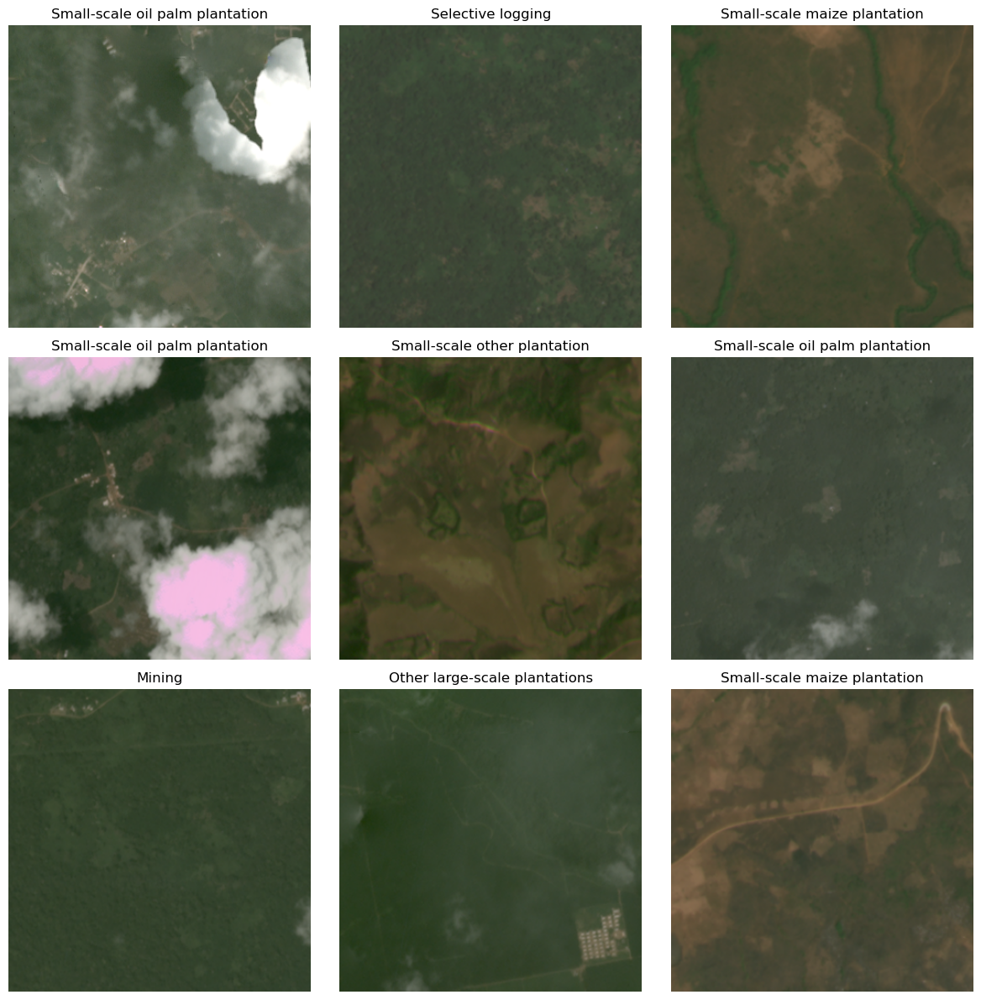

In [91]:
labels_df = pd.read_csv('planet_labels.csv')

# 2. Take 9 random samples
sample_df = labels_df.sample(n=9).reset_index(drop=True)

# 3. Plot in a 3×3 grid
fig, axes = plt.subplots(3, 3, figsize=(12, 12))

for ax, (_, row) in zip(axes.flat, sample_df.iterrows()):
    ex_path = row['example_path']  # e.g. "my_examples_planet_final_detailed/9.89637_3.91875"
    vis_dir = os.path.join(ex_path, 'images', 'visible')
    
    # find the visible image file in that folder
    files = [f for f in os.listdir(vis_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    if not files:
        raise FileNotFoundError(f"No visible images found in {vis_dir}")
    img_file = files[0]  # assumes one image per folder
    
    # load & display
    img = load_and_prepare_vis(os.path.join(vis_dir, img_file))
    ax.imshow(img)
    ax.set_title(row['label'])  # or row['merged_label'] if you prefer
    ax.axis('off')

plt.tight_layout()
plt.show()

In [86]:
classes1=['Oil palm plantation', 'Rubber plantation',
       'Other large-scale plantations', 'Fruit plantation',
       'Timber plantation', 'Mining', 'Wildfire']

classes2=[
       'Selective logging', 'Small-scale maize plantation',
       'Small-scale oil palm plantation', 'Small-scale other plantation',
       'Grassland shrubland', 'Other', 'Infrastructure']

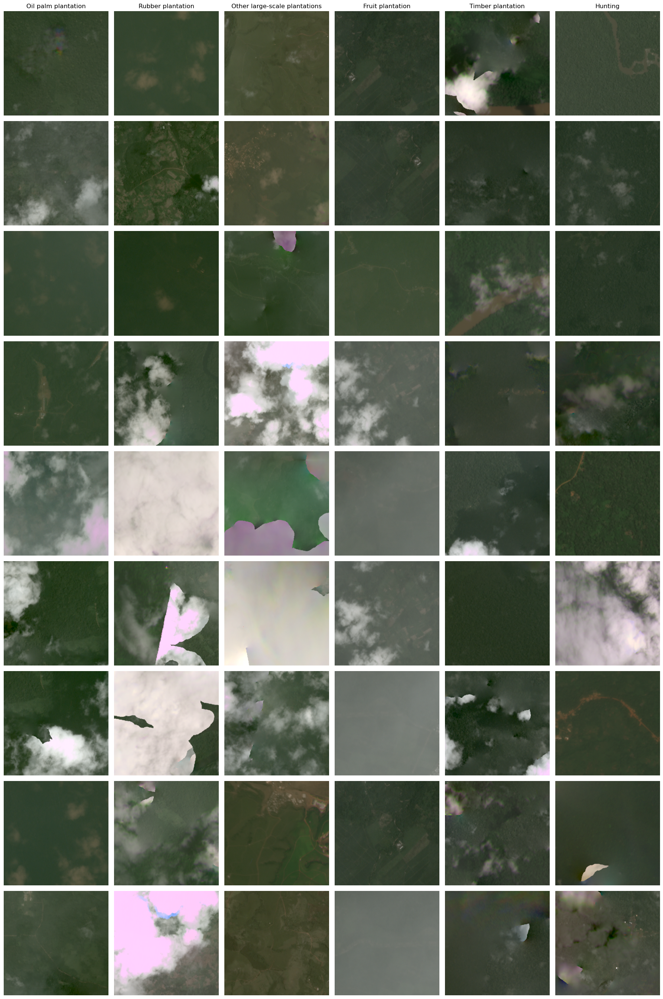

In [92]:


# 2. Determine unique classes
classes = labels_df['label'].unique()
n_classes = len(classes)

# 3. Sample 9 images per class (with replacement if fewer than 9 exist)
samples_per_class = {}
for cls in classes1:
    cls_df = labels_df[labels_df['label'] == cls]
    replace = len(cls_df) < 9
    samples_per_class[cls] = cls_df.sample(n=9, replace=replace).reset_index(drop=True)

n_classes=len(classes1)
# 4. Set up the plot: 9 rows × n_classes columns
fig, axes = plt.subplots(9, n_classes, figsize=(n_classes * 3, 9 * 3))

for c, cls in enumerate(classes1):
    # Add class title atop the column
    axes[0, c].set_title(cls, fontsize=12)
    
    for r in range(9):
        row = samples_per_class[cls].iloc[r]
        ex_path = row['example_path']
        vis_dir = os.path.join(ex_path, 'images', 'visible')
        
        # grab the first visible image file in that folder
        files = [f for f in os.listdir(vis_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if not files:
            raise FileNotFoundError(f"No visible images found in {vis_dir}")
        img_file = files[0]
        
        img = load_and_prepare_vis(os.path.join(vis_dir, img_file))
        
        ax = axes[r, c]
        ax.imshow(img)
        ax.axis('off')

plt.tight_layout()
plt.show()